<a href="https://colab.research.google.com/github/AliVaghjipur/BehavioralCloning/blob/main/Final_BehaviouralCloning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/AliVaghjipur/Track

Cloning into 'Track'...
remote: Enumerating objects: 14485, done.
remote: Total 14485 (delta 0), reused 0 (delta 0), pack-reused 14485
Receiving objects: 100% (14485/14485), 185.92 MiB | 39.57 MiB/s, done.
Updating files: 100% (14482/14482), done.


In [ ]:
!ls Track

driving_log.csv  IMG


In [ ]:
!pip3 install imgaug

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg    #to load image
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import random
import ntpath   #to get only the ending part of our path/image name
import os


In [ ]:
datadir = 'Track'



columns = ['center', 'left', 'right','steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)

pd.set_option("display.max_colwidth", -1)   #to get proper column width to see the data
data.head()   #to view the first 5 lines of the frame



<ipython-input-57-3aa54d4f2df0>:8: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option("display.max_colwidth", -1)   #to get proper column width to see the data


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\center_2023_04_30_15_36_07_246.jpg,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\left_2023_04_30_15_36_07_246.jpg,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\right_2023_04_30_15_36_07_246.jpg,0.0,0.0,0.0,0.000078
1,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\center_2023_04_30_15_36_07_348.jpg,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\left_2023_04_30_15_36_07_348.jpg,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\right_2023_04_30_15_36_07_348.jpg,0.0,0.0,0.0,0.000079
2,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\center_2023_04_30_15_36_07_450.jpg,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\left_2023_04_30_15_36_07_450.jpg,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\right_2023_04_30_15_36_07_450.jpg,0.0,0.0,0.0,0.000078
3,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\center_2023_04_30_15_36_07_551.jpg,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\left_2023_04_30_15_36_07_551.jpg,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\right_2023_04_30_15_36_07_551.jpg,0.0,0.0,0.0,0.000081
4,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\center_2023_04_30_15_36_07_653.jpg,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\left_2023_04_30_15_36_07_653.jpg,C:\Users\Administrator\Desktop\finding-lanes\Behaviora_Cloning\IMG\right_2023_04_30_15_36_07_653.jpg,0.0,0.0,0.0,0.000078


In [ ]:
def path_leaf(path):    #to get only the ending part of our path/image name
  head, tail = ntpath.split(path)
  # head, tail = os.path.splitext(path).split('/')[-1]
  return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)    #if shows error, chatgpt suggested data['right'].astype(str).apply(path_leaf)
pd.set_option("display.max_colwidth", -1)
data.head()


<ipython-input-58-efc5894628d2>:9: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option("display.max_colwidth", -1)


,center,left,right,steering,throttle,reverse,speed
0,center_2023_04_30_15_36_07_246.jpg,left_2023_04_30_15_36_07_246.jpg,right_2023_04_30_15_36_07_246.jpg,0.0,0.0,0.0,0.000078
1,center_2023_04_30_15_36_07_348.jpg,left_2023_04_30_15_36_07_348.jpg,right_2023_04_30_15_36_07_348.jpg,0.0,0.0,0.0,0.000079
2,center_2023_04_30_15_36_07_450.jpg,left_2023_04_30_15_36_07_450.jpg,right_2023_04_30_15_36_07_450.jpg,0.0,0.0,0.0,0.000078
3,center_2023_04_30_15_36_07_551.jpg,left_2023_04_30_15_36_07_551.jpg,right_2023_04_30_15_36_07_551.jpg,0.0,0.0,0.0,0.000081
4,center_2023_04_30_15_36_07_653.jpg,left_2023_04_30_15_36_07_653.jpg,right_2023_04_30_15_36_07_653.jpg,0.0,0.0,0.0,0.000078


[-1.   -0.92 -0.84 -0.76 -0.68 -0.6  -0.52 -0.44 -0.36 -0.28 -0.2  -0.12
 -0.04  0.04  0.12  0.2   0.28  0.36  0.44  0.52  0.6   0.68  0.76  0.84
  0.92  1.  ]


<BarContainer object of 25 artists>

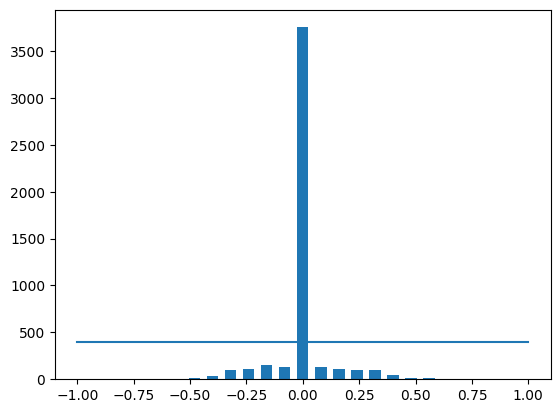

In [ ]:
#constructing histogram to see which steering angles are more frequent throughout the recording. (visiualising the data)

num_bins = 25    #dividing the entire range of values into intervals
samples_per_bin = 400  #Setting threshold so that the algorithm is not biased to one high value (0 steering angle is too much)
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+bins[1:]) * 0.5     #New rantge after adding neighbouring pairs of numbers and then dividing them by 2 so that -0.04 + 0.04 becomes 0
print(bins)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))  #plotting the threshold line
plt.bar(center, hist, width=0.05)

total data: 4827
removed 3353
remaining: 1474


<BarContainer object of 25 artists>

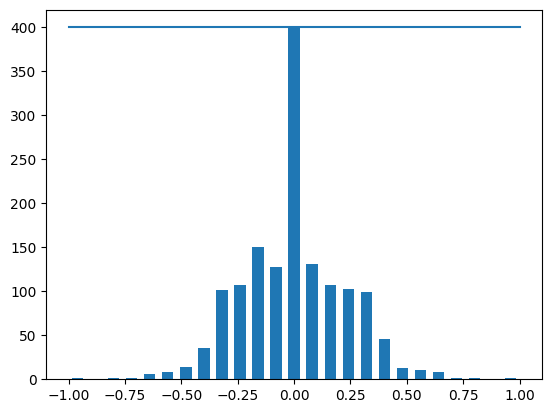

In [ ]:
#removing some samples to make the dataset more equal instead of being biased at 0 steering angle
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ =np.histogram(data['steering'], (num_bins))

plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))  #plotting the threshold line
plt.bar(center, hist, width=0.05)

In [ ]:
print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]   #allows us to perform a selection on a row of data from our dataframe
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))    #.strip elimates any spaces that might be in the string
    steering.append(float(indexed_data[3]))
  image_paths = np.array(image_path)
  steerings = np.array(steering)
  return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2023_04_30_15_36_08_779.jpg
left        left_2023_04_30_15_36_08_779.jpg  
right       right_2023_04_30_15_36_08_779.jpg 
steering   -0.280655                          
throttle    1.0                               
reverse     0.0                               
speed       6.539091                          
Name: 15, dtype: object


In [ ]:
#splitting training testing data

X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training sample: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training sample: 1179
Valid Samples: 295


Text(0.5, 1.0, 'Validation Set')

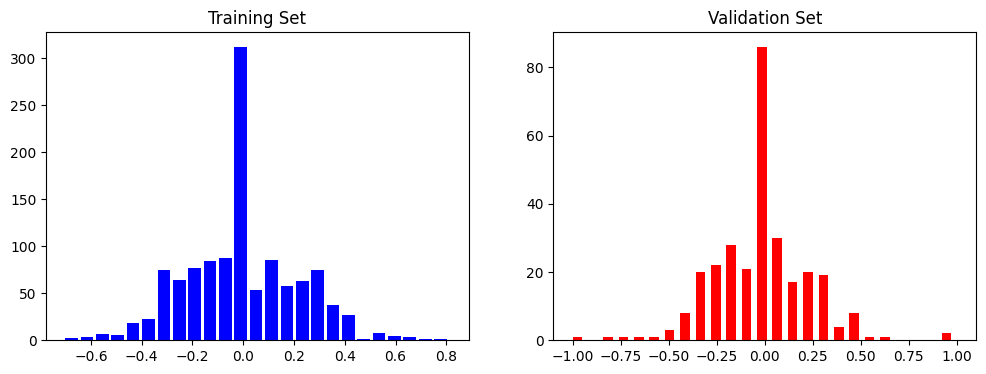

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training Set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation Set')

In [ ]:
#Image augmentation part using imgaug; 1st Zoom augmentation 

def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))   #zooming in to the image, 1 being no zoom and 1.3 being the upper limit of zoom
  image = zoom.augment_image(image)
  return image

Text(0.5, 1.0, 'Zoomed Image')

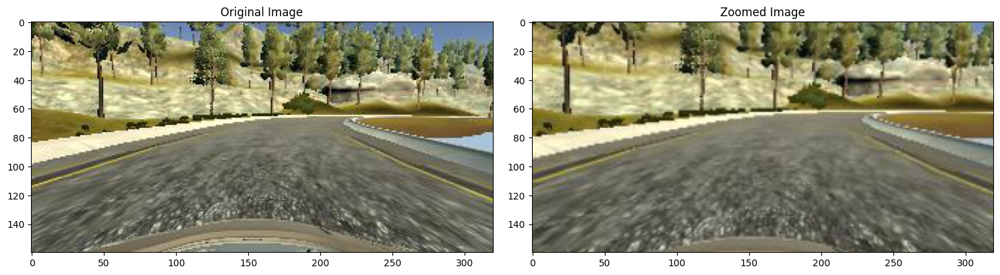

In [ ]:
#testing the above done augmentation on a random image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

In [ ]:
# 2nd Pan augmentation
def pan(image):
  pan = iaa.Affine(translate_percent={ 'x' : (-0.1, 0.1), 'y': (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

Text(0.5, 1.0, 'Zoomed Image')

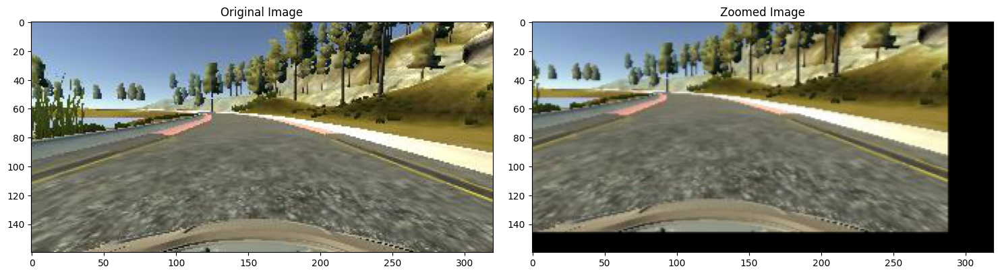

In [ ]:
#testing the above done augmentation on a random image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Zoomed Image')

In [ ]:
# 3rd Altering Brightness image augmentation
def img_random_brightness(image):
  brightness = iaa.Multiply((0.2, 1.2))      #pixels multiplied by less than 1 value become darker
  image = brightness.augment_image(image)
  return image

Text(0.5, 1.0, 'Brightness altered Image')

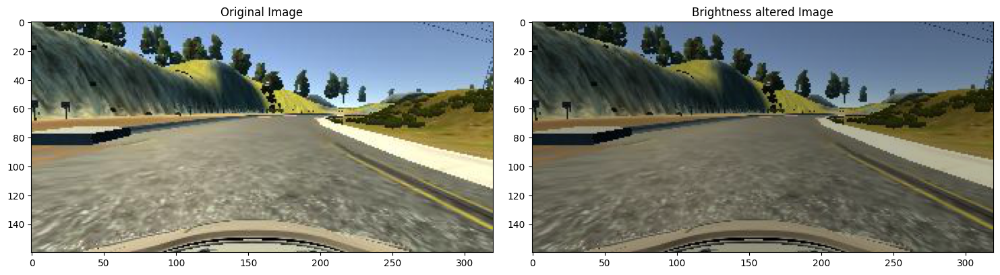

In [ ]:
#testing the above done augmentation on a random image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered Image')

In [ ]:
# 4th Flipping augmentation

def img_random_flip(image, steering_angle):
  image = cv2.flip(image, 1)   #0 = vertical flip, 1 = Horizontal flip, -1 = combination of both 0 and 1
  steering_angle = -steering_angle
  return image, steering_angle

Text(0.5, 1.0, 'Flipped Image -Steering Angle:-0.0')

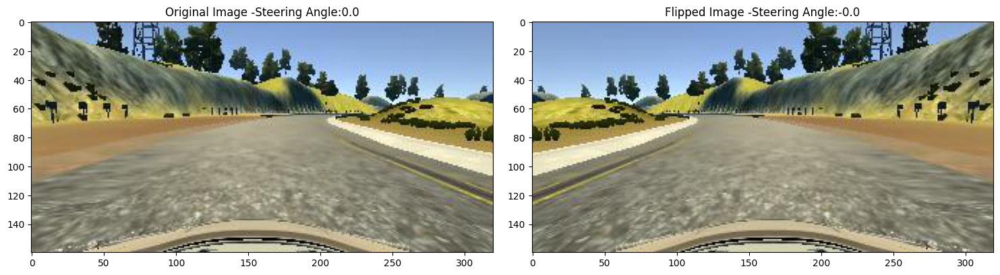

In [ ]:
#testing the above done augmentation on a random image

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image -' + 'Steering Angle:' +str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image -' + 'Steering Angle:' + str(flipped_steering_angle))

In [ ]:
#We dont want all augmentations to work on every image. We just want each augmentation to apply on 50% of the newly augmented images.
def random_augment(image, steering_angle):
  image = mpimg.imread(image)
  if np.random.rand() < 0.5:
    image = pan(image)    #pan augmentation is only applied 50% of the time
  if np.random.rand() < 0.5:
    image = zoom(image)    #pan augmentation is only applied 50% of the time
  if np.random.rand() < 0.5:
    image = img_random_brightness(image)    #pan augmentation is only applied 50% of the time
  if np.random.rand() < 0.5:
    image, steering =  img_random_flip(image, steering_angle)    #pan augmentation is only applied 50% of the time
  
  return image, steering_angle

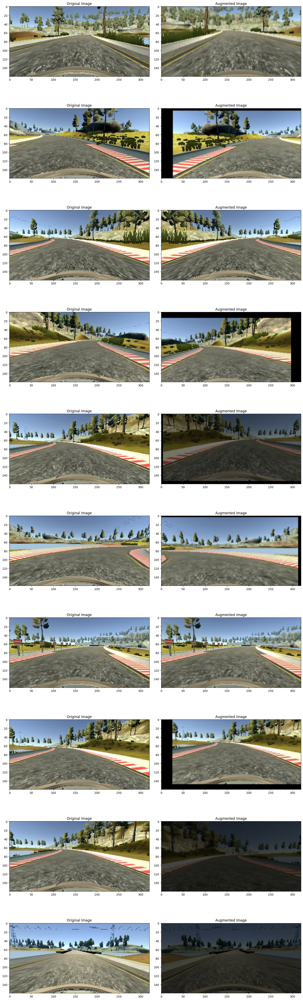

In [ ]:
#Printing 10 images with original and augmented side by side as a test

ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths)-1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title('Original Image')

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title('Augmented Image')  

In [ ]:
def img_preprocess(img):
  img = img[60:135 , :, :]   #cropping image height as the hood at bottom and trees at top are not important
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)    #RGB to YUV colorspace. YUV colorspace is good to train an Nvidia Neural model.
  img = cv2.GaussianBlur(img, (3, 3), 0)  #Kernel size (3, 3) and deviation of kernel 0
  img = cv2.resize(img, (200, 66))
  img = img/255   #normalization
  return img

Text(0.5, 1.0, 'Preprocessed Image')

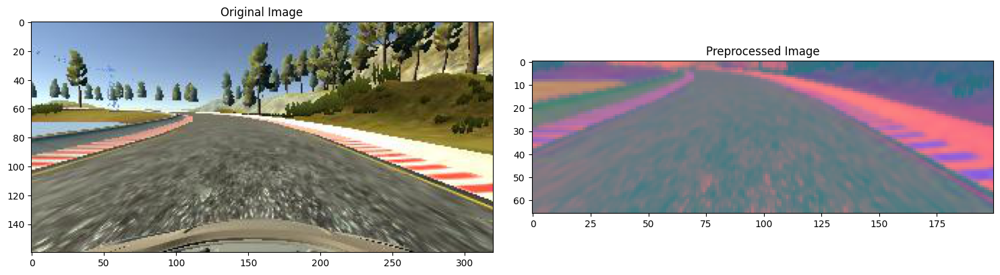

In [ ]:
#just to visualise the effects of the above done preprocessing on a random image:

image = image_paths[100]    #visualising using any random image (100th image)
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image )
axs[1].set_title('Preprocessed Image')

In [ ]:
#Generating batches of augmented images for the dataset

def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths)-1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index]) 
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    
    yield(np.asarray(batch_img), np.asarray(batch_steering))


Text(0.5, 1.0, 'Validation Image')

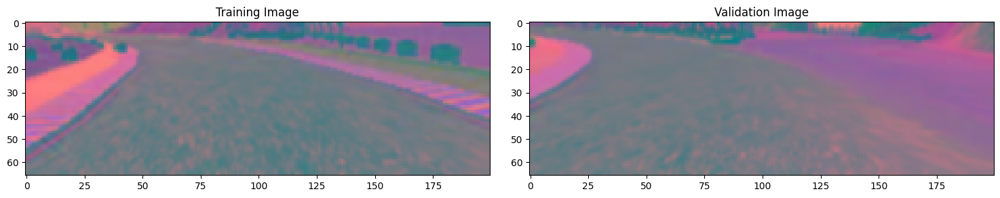

In [ ]:
#requests the next bacth of images from the generator

x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))   #generates only 1 image and istraining value = 1 = true
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

#plotting these generated images#

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [ ]:
#Defining Nvidia model

def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, kernel_size=(5,5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, kernel_size=(5,5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, kernel_size=(5,5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, kernel_size=(3, 3), activation='elu'))   #new activation elu insteaed of relu
  model.add(Conv2D(64, kernel_size=(3, 3), activation='elu'))
  # model.add(Dropout(0.5))

  model.add(Flatten())
  model.add(Dense(100, activation= 'elu'))   #100 nodes in first dense layer
  # model.add(Dropout(0.5))

  model.add(Dense(50, activation= 'elu'))
  # model.add(Dropout(0.5))

  model.add(Dense(10, activation= 'elu'))
  # model.add(Dropout(0.5))
  
  model.add(Dense(1))   #layer ouputs the predicted steering angle
  
  optimizer = Adam(learning_rate=1e-4)    #1e-4 = 10^-4 = 0.0001
  model.compile(loss='mse', optimizer=optimizer)
  return model



In [ ]:
model = nvidia_model()
print(model.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 31, 98, 24)        1824      
                                                                 
 conv2d_16 (Conv2D)          (None, 14, 47, 36)        21636     
                                                                 
 conv2d_17 (Conv2D)          (None, 5, 22, 48)         43248     
                                                                 
 conv2d_18 (Conv2D)          (None, 3, 20, 64)         27712     
                                                                 
 conv2d_19 (Conv2D)          (None, 1, 18, 64)         36928     
                                                                 
 flatten_3 (Flatten)         (None, 1152)              0         
                                                                 
 dense_12 (Dense)            (None, 100)              

In [ ]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                              steps_per_epoch=300,
                              epochs=10,
                              validation_data = batch_generator(X_valid, y_valid, 100, 0),
                              validation_steps=200,
                              verbose = 1,
                              shuffle = 1) 


<ipython-input-80-e70284494671>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 150s 499ms/step - loss: 0.0503 - val_loss: 0.0515
Epoch 2/10
300/300 [==============================] - 136s 454ms/step - loss: 0.0455 - val_loss: 0.0489
Epoch 3/10
300/300 [==============================] - 141s 470ms/step - loss: 0.0433 - val_loss: 0.0458
Epoch 4/10
300/300 [==============================] - 135s 452ms/step - loss: 0.0431 - val_loss: 0.0424
Epoch 5/10
300/300 [==============================] - 136s 453ms/step - loss: 0.0421 - val_loss: 0.0402
Epoch 6/10
300/300 [==============================] - 135s 451ms/step - loss: 0.0415 - val_loss: 0.0399
Epoch 7/10
300/300 [==============================] - 139s 465ms/step - loss: 0.0409 - val_loss: 0.0411
Epoch 8/10
300/300 [==============================] - 132s 440ms/step - loss: 0.0401 - val_loss: 0.0379
Epoch 9/10
300/300 [==============================] - 132s 442ms/step - loss: 0.0391 - val_loss: 0.0372
Epoch 10/10
300/300 [==============================] - 133s 444m

Text(0.5, 0, 'Epoch')

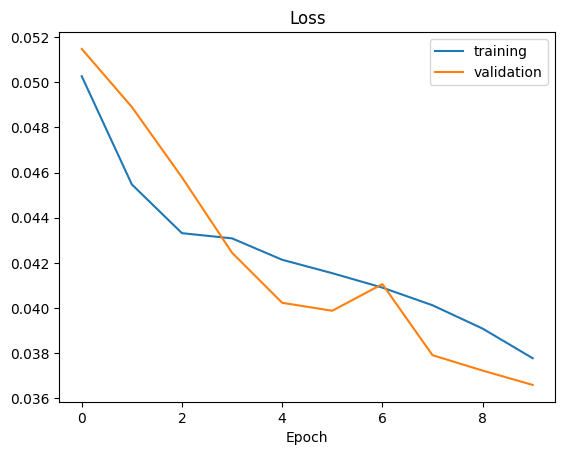

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('model.h5')


In [ ]:
#to download file/model
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>